# Importing Libraries

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

# Load Dataset

In [3]:
train = pd.read_csv("./Documents/PROJECTS/APS Failure detection/aps_failure_training_set.csv")
test  = pd.read_csv("./Documents/PROJECTS/APS Failure detection/aps_failure_test_set.csv")

In [4]:
print(train.shape)
print(test.shape)

(60000, 171)
(16000, 171)


In [5]:
train.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


In [6]:
test.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0


In [7]:
data = pd.concat([train,test]).reset_index(drop=True)

In [8]:
data.shape

(76000, 171)

In [9]:
data.head()

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


In [10]:
data['class'].unique()

array(['neg', 'pos'], dtype=object)

In [11]:
data['class'].value_counts()

neg    74625
pos     1375
Name: class, dtype: int64

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 171 entries, class to eg_000
dtypes: int64(1), object(170)
memory usage: 99.2+ MB


In [13]:
data.describe()

,aa_000
count,7.600000e+04
mean,6.115976e+04
std,2.647366e+05
min,0.000000e+00
25%,8.600000e+02
50%,3.081300e+04
75%,4.884000e+04
max,4.294967e+07


In [14]:
data.describe(include='O')

,class,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
count,76000,76000,76000,76000,76000,76000,76000,76000,76000,76000,...,76000,76000,76000,76000,76000,76000,76000,76000,76000,76000
unique,2,31,2230,2028,356,459,199,796,2953,9384,...,40697,37292,41658,43052,37561,35860,28413,10948,31,56
top,neg,na,0,na,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
freq,74625,58692,11041,18842,70307,70217,74882,74162,71135,59336,...,1720,1963,2266,3549,5609,9959,21780,40295,72188,71901


In [15]:
data.duplicated().sum()

0

In [16]:
df = data.copy()

In [17]:
df.shape

(76000, 171)

In [18]:
df.info(max_cols=172, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Data columns (total 171 columns):
 #    Column  Non-Null Count  Dtype 
---   ------  --------------  ----- 
 0    class   76000 non-null  object
 1    aa_000  76000 non-null  int64 
 2    ab_000  76000 non-null  object
 3    ac_000  76000 non-null  object
 4    ad_000  76000 non-null  object
 5    ae_000  76000 non-null  object
 6    af_000  76000 non-null  object
 7    ag_000  76000 non-null  object
 8    ag_001  76000 non-null  object
 9    ag_002  76000 non-null  object
 10   ag_003  76000 non-null  object
 11   ag_004  76000 non-null  object
 12   ag_005  76000 non-null  object
 13   ag_006  76000 non-null  object
 14   ag_007  76000 non-null  object
 15   ag_008  76000 non-null  object
 16   ag_009  76000 non-null  object
 17   ah_000  76000 non-null  object
 18   ai_000  76000 non-null  object
 19   aj_000  76000 non-null  object
 20   ak_000  76000 non-null  object
 21   al_000  76000 non-null  object
 2

In [19]:
num_f = [feature for feature in df.columns if df[feature].dtype != 'O']
cat_f = [feature for feature in df.columns if df[feature].dtype == 'O']

print("we have {} numerical features: {}".format(len(num_f), num_f))
print("we have {} categorical features: {}".format(len(cat_f), cat_f))

we have 1 numerical features: ['aa_000']
we have 170 categorical features: ['class', 'ab_000', 'ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'as_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bk_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000', 'bq_000', 'br_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'cd_000', 'ce_000', 'cf_000', 'cg_000

In [20]:
for col in cat_f:
    print(df[col].value_counts(normalize=True)*100)
    print('---------------------------')

neg    98.190789
pos     1.809211
Name: class, dtype: float64
---------------------------
na     77.226316
0      18.213158
2       3.268421
4       0.706579
6       0.239474
8       0.119737
10      0.067105
12      0.047368
14      0.025000
16      0.011842
24      0.011842
18      0.007895
20      0.006579
26      0.006579
22      0.005263
38      0.005263
34      0.003947
100     0.003947
58      0.003947
28      0.003947
32      0.002632
52      0.001316
90      0.001316
134     0.001316
204     0.001316
36      0.001316
48      0.001316
44      0.001316
46      0.001316
68      0.001316
30      0.001316
Name: ab_000, dtype: float64
---------------------------
0             14.527632
2130706432    10.343421
na             5.606579
2130706434     2.036842
2              1.280263
                ...    
3032           0.001316
3264           0.001316
3416           0.001316
7702           0.001316
3490           0.001316
Name: ac_000, Length: 2230, dtype: float64
-------------------

In [21]:
df.replace(to_replace=['na','nan'], value=np.NaN, inplace=True)

In [22]:
df.isna().sum()

class         0
aa_000        0
ab_000    58692
ac_000     4261
ad_000    18842
          ...  
ee_007      863
ee_008      863
ee_009      863
ef_000     3486
eg_000     3485
Length: 171, dtype: int64

In [23]:
nul_values = pd.DataFrame(df.isnull().sum(), columns = ["No.of null values"])
nul_values.loc[:, '%of null values'] = np.round(nul_values.loc[:,'No.of null values']/ df.shape[0]*100, 2)
nul_values.loc[nul_values.loc[:,"No.of null values"]>0, :].sort_values(by = "No.of null values", ascending = True)
pd.set_option('display.max_rows', None)
nul_values

,No.of null values,%of null values
class,0,0.00
aa_000,0,0.00
ab_000,58692,77.23
ac_000,4261,5.61
ad_000,18842,24.79
ae_000,3190,4.20
af_000,3190,4.20
ag_000,860,1.13
ag_001,860,1.13
ag_002,860,1.13


In [24]:
df['class'] = df['class'].map({'neg':0, 'pos':1})

In [25]:
df['class'].value_counts()

0    74625
1     1375
Name: class, dtype: int64

<AxesSubplot:xlabel='class', ylabel='count'>

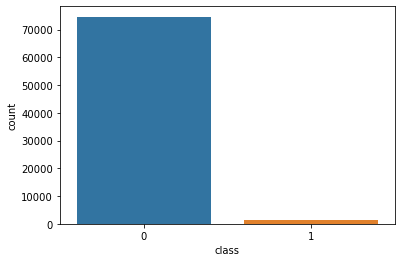

In [26]:
sns.countplot(df['class'])

In [27]:
drop_column = df.columns[df.isnull().mean()>0.3]
drop_column

Index(['ab_000', 'bk_000', 'bl_000', 'bm_000', 'bn_000', 'bo_000', 'bp_000',
       'bq_000', 'br_000', 'cr_000'],
      dtype='object')

In [28]:
df.drop(drop_column, axis=1, inplace=True)

In [29]:
df.shape

(76000, 161)

In [30]:
num_fs = [feature for feature in df.columns if df[feature].dtype != 'O']
cat_fs = [feature for feature in df.columns if df[feature].dtype == 'O']

print("we have {} numerical features :{}".format(len(num_fs), num_fs))
print("we have {} categorical features :{}".format(len(cat_fs), cat_fs))

we have 2 numerical features :['class', 'aa_000']
we have 159 categorical features :['ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'as_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'cd_000', 'ce_000', 'cf_000', 'cg_000', 'ch_000', 'ci_000', 'cj_000', 'ck_000', 'cl_000', 'cm_000', 'cn_000', 'cn_001', 'cn_002

In [31]:
for col in df:
    df[col].fillna(df[col].median(), inplace=True)

In [32]:
df.isnull().sum()

class     0
aa_000    0
ac_000    0
ad_000    0
ae_000    0
af_000    0
ag_000    0
ag_001    0
ag_002    0
ag_003    0
ag_004    0
ag_005    0
ag_006    0
ag_007    0
ag_008    0
ag_009    0
ah_000    0
ai_000    0
aj_000    0
ak_000    0
al_000    0
am_0      0
an_000    0
ao_000    0
ap_000    0
aq_000    0
ar_000    0
as_000    0
at_000    0
au_000    0
av_000    0
ax_000    0
ay_000    0
ay_001    0
ay_002    0
ay_003    0
ay_004    0
ay_005    0
ay_006    0
ay_007    0
ay_008    0
ay_009    0
az_000    0
az_001    0
az_002    0
az_003    0
az_004    0
az_005    0
az_006    0
az_007    0
az_008    0
az_009    0
ba_000    0
ba_001    0
ba_002    0
ba_003    0
ba_004    0
ba_005    0
ba_006    0
ba_007    0
ba_008    0
ba_009    0
bb_000    0
bc_000    0
bd_000    0
be_000    0
bf_000    0
bg_000    0
bh_000    0
bi_000    0
bj_000    0
bs_000    0
bt_000    0
bu_000    0
bv_000    0
bx_000    0
by_000    0
bz_000    0
ca_000    0
cb_000    0
cc_000    0
cd_000    0
ce_000    0
cf_0

In [33]:
for i in cat_fs:
    if df[i].dtype == 'O':
        df[i] = df[i].astype('float')

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76000 entries, 0 to 75999
Columns: 161 entries, class to eg_000
dtypes: float64(159), int64(2)
memory usage: 93.4 MB


In [35]:
num_fs = [feature for feature in df.columns if df[feature].dtype != 'O']
cat_fs = [feature for feature in df.columns if df[feature].dtype == 'O']

print("we have {} numerical features :{}".format(len(num_fs), num_fs))
print('======================================================================')
print("we have {} categorical features :{}".format(len(cat_fs), cat_fs))

we have 161 numerical features :['class', 'aa_000', 'ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000', 'ag_001', 'ag_002', 'ag_003', 'ag_004', 'ag_005', 'ag_006', 'ag_007', 'ag_008', 'ag_009', 'ah_000', 'ai_000', 'aj_000', 'ak_000', 'al_000', 'am_0', 'an_000', 'ao_000', 'ap_000', 'aq_000', 'ar_000', 'as_000', 'at_000', 'au_000', 'av_000', 'ax_000', 'ay_000', 'ay_001', 'ay_002', 'ay_003', 'ay_004', 'ay_005', 'ay_006', 'ay_007', 'ay_008', 'ay_009', 'az_000', 'az_001', 'az_002', 'az_003', 'az_004', 'az_005', 'az_006', 'az_007', 'az_008', 'az_009', 'ba_000', 'ba_001', 'ba_002', 'ba_003', 'ba_004', 'ba_005', 'ba_006', 'ba_007', 'ba_008', 'ba_009', 'bb_000', 'bc_000', 'bd_000', 'be_000', 'bf_000', 'bg_000', 'bh_000', 'bi_000', 'bj_000', 'bs_000', 'bt_000', 'bu_000', 'bv_000', 'bx_000', 'by_000', 'bz_000', 'ca_000', 'cb_000', 'cc_000', 'cd_000', 'ce_000', 'cf_000', 'cg_000', 'ch_000', 'ci_000', 'cj_000', 'ck_000', 'cl_000', 'cm_000', 'cn_000', 'cn_001', 'cn_002', 'cn_003', 'cn_004', 'cn_005', 

In [36]:
for i in num_fs:
    if df[i].dtype != 'O':
        df[i]=df[i].astype('int')

In [37]:
df.head()

,class,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,2130706438,280,0,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,0,128,0,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,228,100,0,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,70,66,0,10,0,0,0,318,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,1368,458,0,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


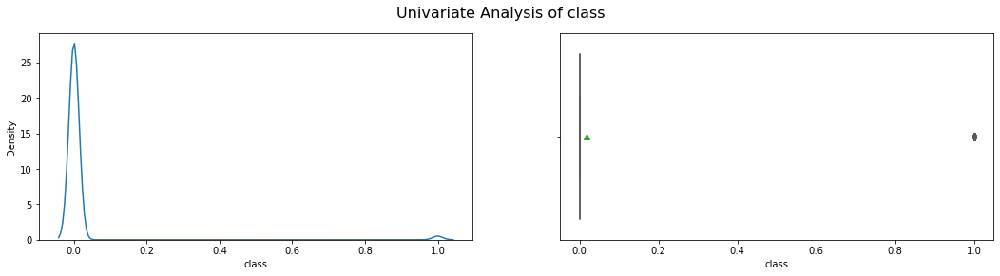

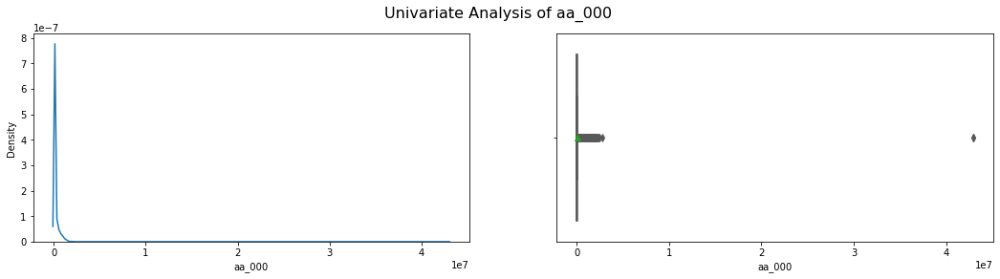

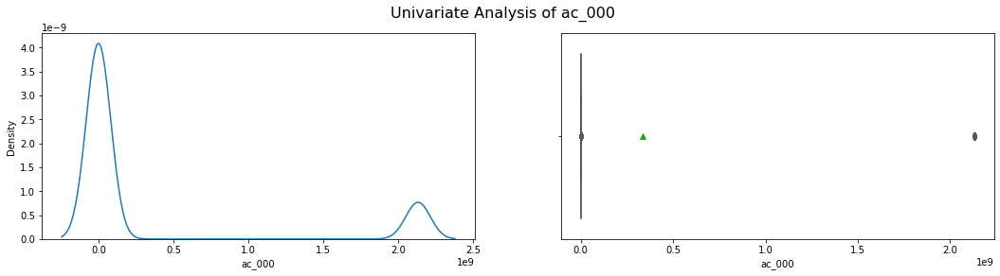

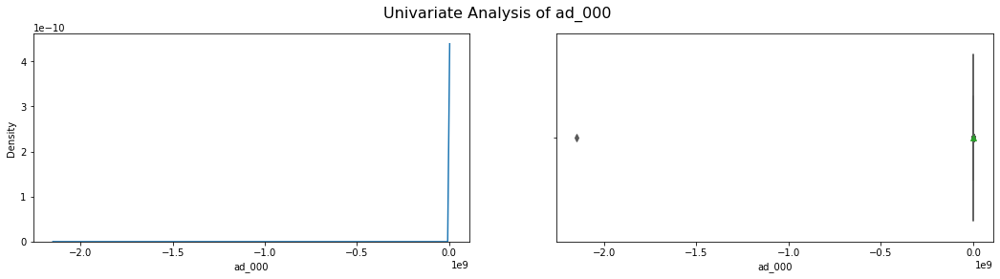

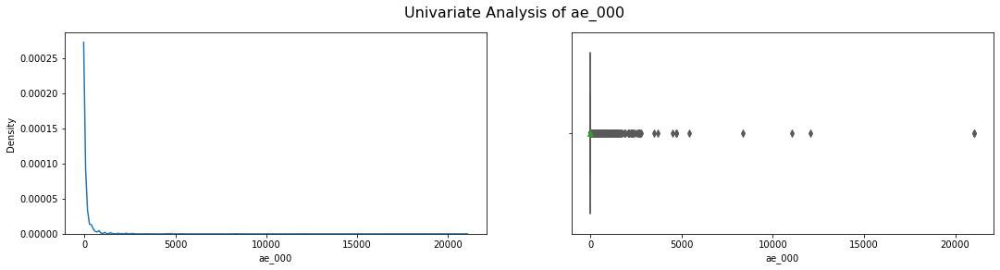

...

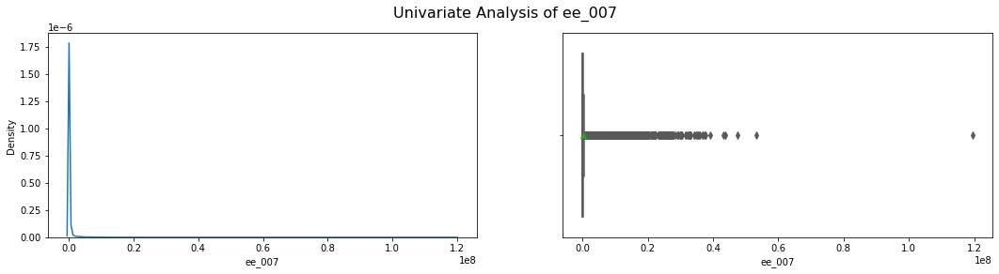

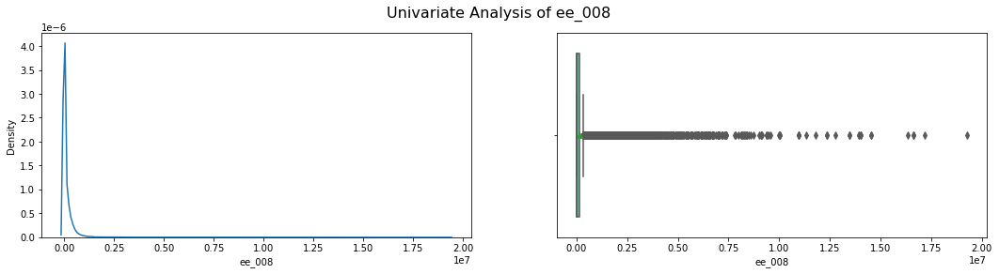

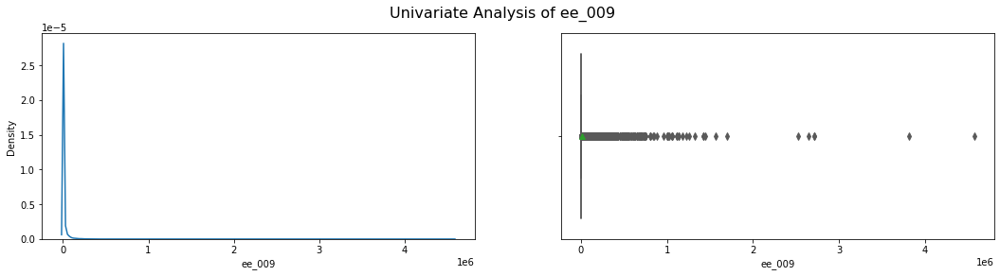

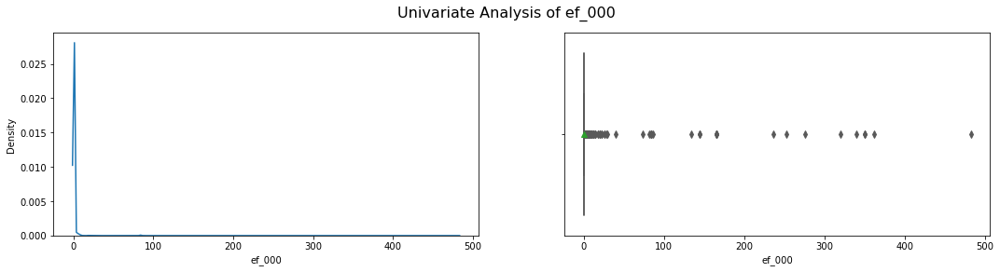

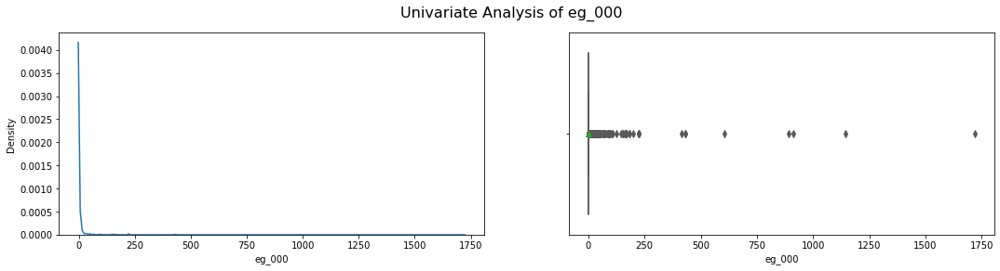

In [38]:
x_axis = num_fs
for x in x_axis:
    fig, axes = plt.subplots(1,2, figsize=(18,4))
    sns.distplot(df[x], ax=axes[0], kde=True, hist=False)
    sns.boxplot(df[x], ax=axes[1], orient='h', showmeans=True, palette='Set2')
    fig.suptitle('Univariate Analysis of '+x, fontsize=16)

In [39]:
fig = plt.figure(figsize=(20, 850))
for i in range(0, len(num_fs)):
    ax = plt.subplot(81, 2, i+1)
    sns.regplot(data=df, y='class', x=num_fs[i], color='b')
    plt.tight_layout()

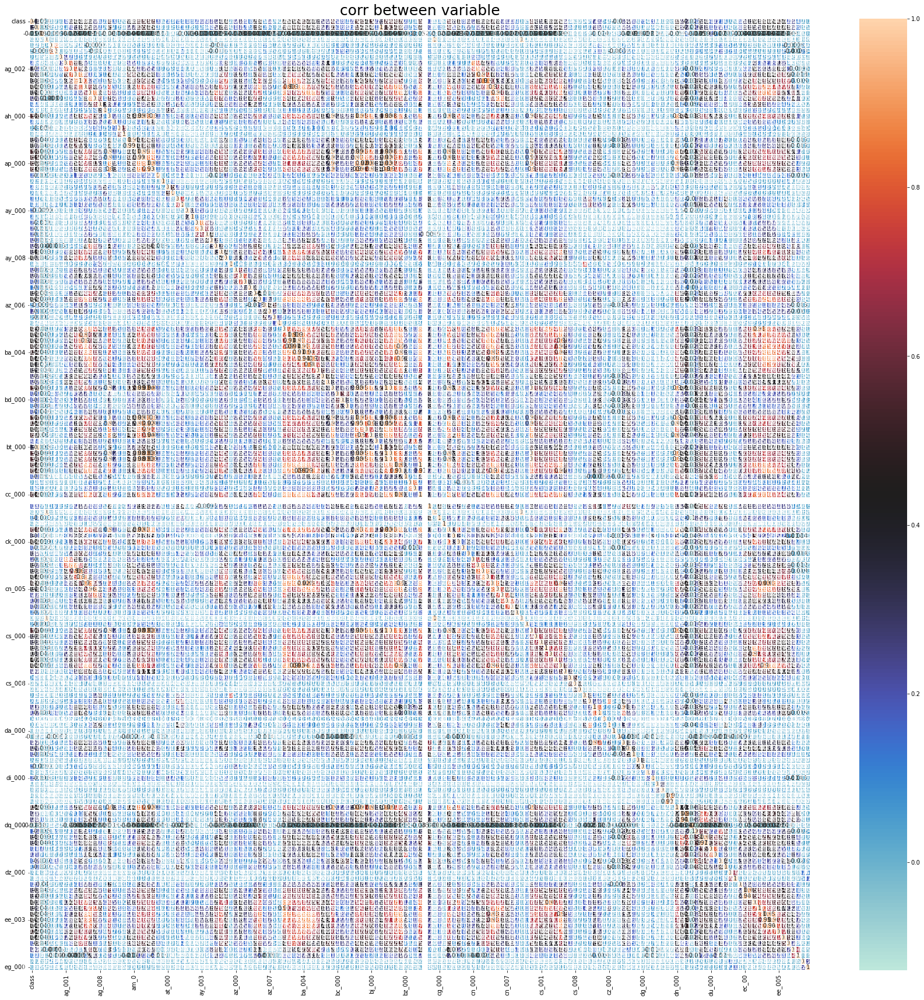

In [40]:
sns.heatmap(df.corr(), annot=True, cmap='icefire', linewidths=0.3)
fig = plt.gcf()
fig.set_size_inches(30,30)
plt.title("corr between variable", color='black', size=25)
plt.show()

# Outliers Detection and Removal

In [41]:
#IQR method

def outlier_thresholds(dataframe, variable):
    Q1 = dataframe[variable].quantile(0.25)
    Q3 = dataframe[variable].quantile(0.75)
    IQR = Q3 - Q1
    up_limit = Q3 + 1.5 * IQR
    low_limit = Q1 - 1.5 * IQR
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit
    return dataframe

In [42]:
for feature in num_fs[1:]:
    df = outlier_thresholds(df, feature)

In [43]:
df.shape

(76000, 161)

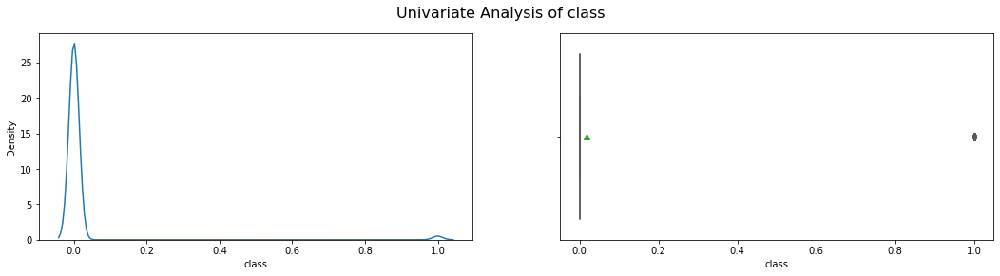

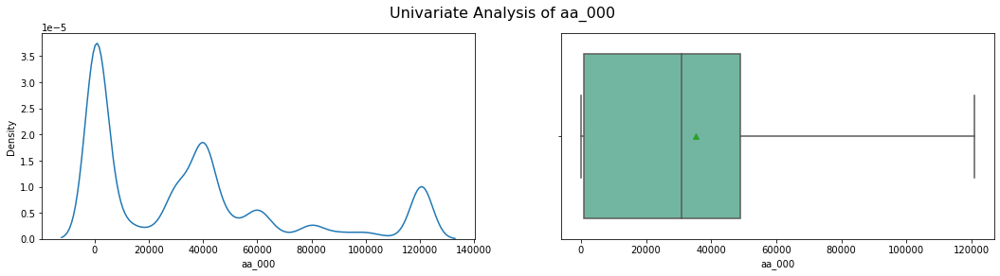

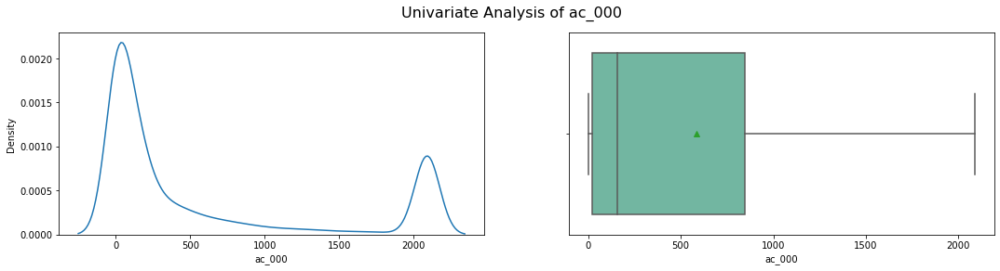

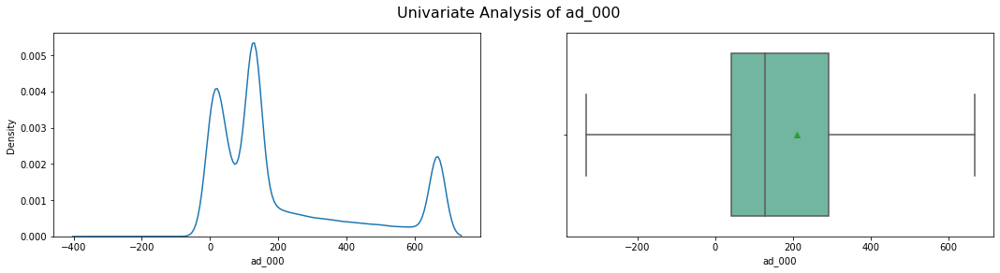

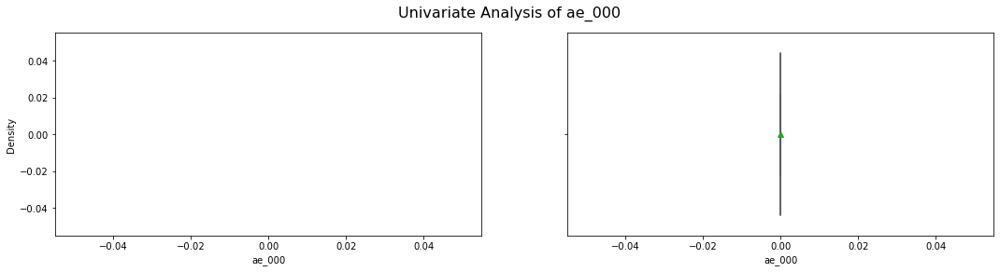

...

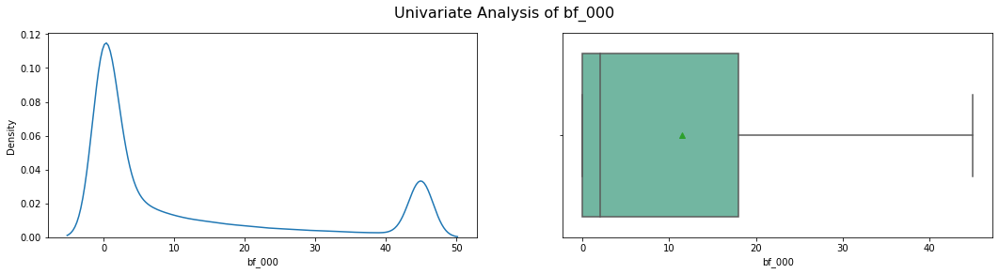

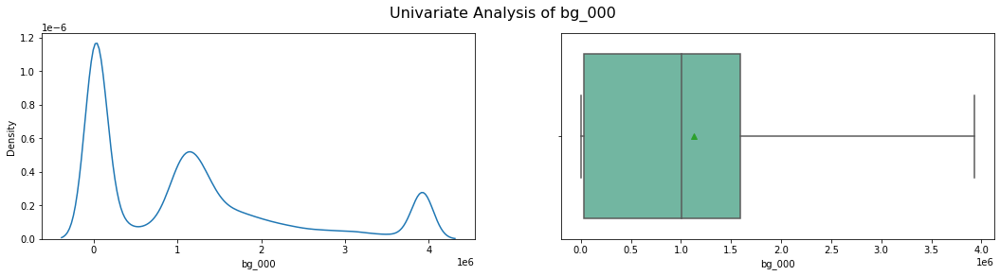

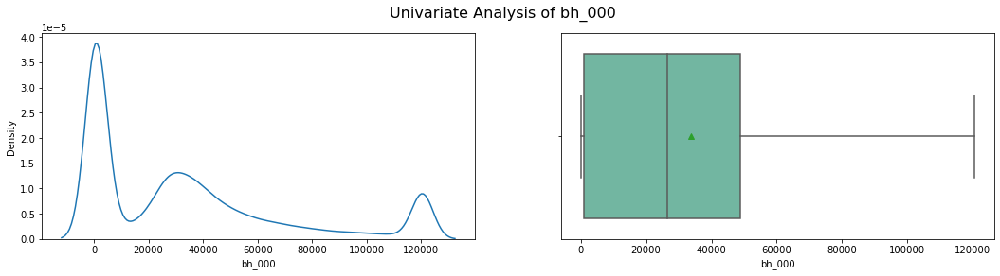

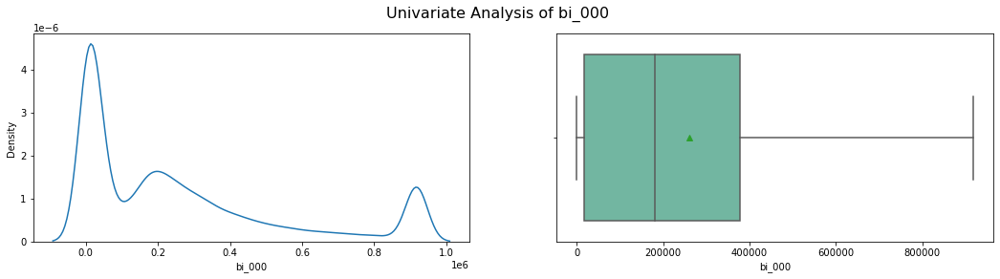

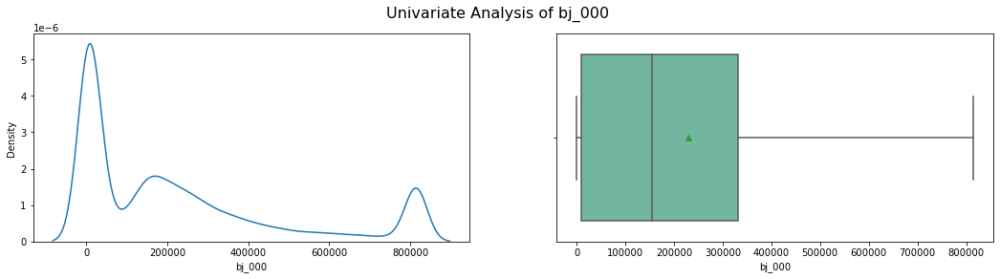

In [ ]:
x_axis = num_fs
for x in x_axis:
    fig, axes = plt.subplots(1,2, figsize=(18,4))
    sns.distplot(df[x], ax=axes[0], kde=True, hist=False)
    sns.boxplot(df[x], ax=axes[1], orient='h', showmeans=True, palette='Set2')
    fig.suptitle('Univariate Analysis of '+x, fontsize=16)

In [ ]:
df

# Split the data into X and y

In [51]:
x = df.drop(['class'], axis=1)
y = df['class']

In [52]:
x.head()

,aa_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,ag_004,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,2090,280,0,0,0,0,0,0,37250.0,...,1083002,493384,721044.0,469792,339156.0,157956,73224.00,0,0,0
1,33058,0,128,0,0,0,0,0,0,18254.0,...,421400,178064,293306.0,245416,133654.0,81140,97576.00,1500,0,0
2,41040,228,100,0,0,0,0,0,0,1648.0,...,277378,159812,423992.0,409564,320746.0,158022,95128.00,514,0,0
3,12,70,66,0,0,0,0,0,0,2212.0,...,240,46,58.0,44,10.0,0,0.00,0,0,0
4,60874,1368,458,0,0,0,0,0,0,43752.0,...,622012,229790,405298.0,347188,286954.0,311560,341053.75,1218,0,0


In [53]:
y

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        1
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       1
24       0
25       0
26       0
27       0
28       0
29       0
30       0
31       0
32       0
33       0
34       0
35       0
36       0
37       0
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       0
48       0
49       0
50       0
51       0
52       0
53       0
54       0
55       0
56       0
57       0
58       0
59       0
60       1
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0
90       0

In [55]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.33, random_state = 716785)

In [56]:
x_train.shape, y_train.shape

((50920, 160), (50920,))

In [57]:
x_test.shape, y_test.shape

((25080, 160), (25080,))

In [58]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

Model Building

Model 1 : Using Logistic Regression

In [59]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.linear_model import LogisticRegression

In [60]:
log_reg = LogisticRegression()
log_reg.fit(x_train, y_train)
y_pred1 = log_reg.predict(x_test)

In [61]:
log_reg.score(x_train, y_train)

0.988648860958366

In [62]:
acc_log = accuracy_score(y_test, y_pred1)
acc_log

0.988237639553429

In [63]:
conf_mat_log = confusion_matrix(y_test, y_pred1)
conf_mat_log

array([[24545,    76],
       [  219,   240]], dtype=int64)

In [64]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred1))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24621
           1       0.76      0.52      0.62       459

    accuracy                           0.99     25080
   macro avg       0.88      0.76      0.81     25080
weighted avg       0.99      0.99      0.99     25080



In [65]:
# Area under curve

auc_log = roc_auc_score(y_test, y_pred1)
auc_log

0.7598945105843807

In [66]:
ROC

NameError: name 'ROC' is not defined

In [67]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred1)

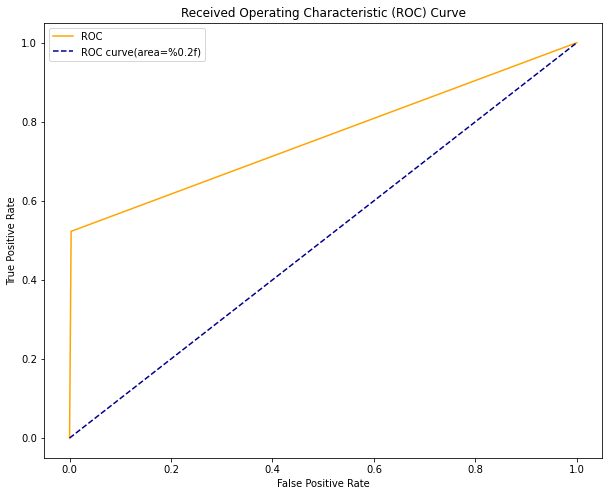

In [68]:
fig = plt.figure(figsize=(10,8))
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0,1], [0,1], color='darkblue', linestyle='--', label='ROC curve(area=%0.2f)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Received Operating Characteristic (ROC) Curve")
plt.legend()
plt.show()

In [69]:
import pickle

with open('APS Failure.ipynb', 'rb') as f:
    data = f.read()


In [70]:
with open('APS Failure.pickle', 'wb') as f:
    pickle.dump(data, f)